# Image Augmentations with TensorFlow

Image augmentations are techniques that modify images in various ways to create new and diverse data for training machine learning models. TensorFlow provides a rich set of tools for image augmentations, such as flipping, rotating, cropping, resizing, adjusting brightness, contrast, saturation, and hue, and applying filters and noise. In this section, we will explore some of these techniques and see how they can enhance the quality and quantity of our image data.

## Sample Images

In this section, we will use some images from my personal image library to demonstrate the image augmentation techniques in TensorFlow. These images are of various scenes and objects, such as landscapes, animals, flowers, and buildings. All images have been resized to 2000 by 1500 pixels for faster processing and analysis.

In [1]:
# Import necessary libraries
import matplotlib.pyplot as plt

# Set font properties for plots
plt.rcParams.update({'font.family': 'Calibri', 'axes.titlesize': 14})

# Define a function to display images with titles and optional settings
def ImShow(Images, Names, title='Images', grayscale=False, figsize=(9.5, 4.5)):
    '''
    Display a pair of images side by side.

    Parameters:
    Images (list): List of two images to be displayed.
    Names (list): List of two names or labels for the images.
    title (str, optional): Title for the figure. Defaults to 'Images'.
    grayscale (bool, optional): If True, display images in grayscale. Defaults to False.
    figsize (tuple, optional): Figure size (width, height) in inches. Defaults to (9.5, 4.5).

    Returns:
    matplotlib.figure.Figure: The figure containing the displayed images.
    numpy.ndarray: The array of subplots for further manipulation.
    '''
    # Create a figure with two subplots
    fig, ax = plt.subplots(1, 2, figsize=figsize)  # Create a figure with 1 row and 2 columns of subplots
    ax = ax.ravel()  # Flatten the subplots for easier manipulation

    # Iterate over the first two images
    for i in range(2):
        # Display the image in grayscale if grayscale is True, otherwise in color
        ax[i].imshow(Images[i], cmap='gray' if grayscale else None)
        ax[i].set_aspect(1)  # Set aspect ratio to 1 (square aspect)
        ax[i].axis('off')  # Turn off axis
        ax[i].set_title(Names[i], weight='bold')  # Set image title with bold font

    if title:
        # Set main title if provided
        fig.suptitle(title, weight='bold', fontsize=16)

    plt.tight_layout()  # Adjust layout for better spacing
    return fig, ax

In [2]:
from skimage import io

class Sample_Images:
    '''
    A class for providing descriptions and images of images.

    Attributes:
    Names (list): List of available image names.

    Methods:
    description(name):
    - Provides a description of the given image name.

    read_image(name):
    - Reads and returns the image as a matrix for the given image name.
    
    title(name):
    - Removes underscores from the image name and provides a formatted title.

    '''
    Names = ['Lake_Como', 'Northwest_Gate', 'Qiansimen_Bridge', 'Lunenburg',
             'Rabbits', 'Squirrel', 'Varenna', 'Waterfront']

    def __init__(self):
        pass

    def description(self, name):
        '''
        Provides a description for the given image name.

        Parameters:
        name (str): The name of the image.

        Returns:
        description (str): A description of the image.
        '''
        descriptions = {
            'Lake_Como': 'A lake in Northern Italy’s Lombardy region.',
            'Northwest_Gate': 'Captures the Northwest Gate of Chongqing, China.',
            'Qiansimen_Bridge': 'Features the Qiansimen Bridge in Chongqing, China.',
            'Lunenburg': 'Lunenburg is a port town on the South Shore of Nova Scotia, Canada',
            'Rabbits': 'Depicts rabbits at Jericho Beach Park in Vancouver, BC, Canada.',
            'Squirrel': 'Features a squirrel at Sea to Sky Gondola in Vancouver, BC, Canada.',
            'Varenna': 'Portrays the picturesque village of Varenna on the shores of Lake Como, Italy.',
            'Waterfront': 'This image was taken from Vancouver Waterfront.'
        }

        if name not in self.Names:
            raise ValueError(f'Image name must be one of {", ".join(self.Names)}')

        return descriptions[name]

    def title(self, name):
        '''
        Removes underscores from the image name and provides a formatted title.

        Parameters:
        name (str): The name of the image.

        Returns:
        title (str): A formatted title for the image.
        '''
        if name not in self.Names:
            raise ValueError(f'Image name must be one of {", ".join(self.Names)}')

        return name.replace("_", " ")

    def read_image(self, name):
        '''
        Reads and returns the image as a matrix for the given image name.

        Parameters:
        name (str): The name of the image.

        Returns:
        image (ndarray): The loaded image in ndarray format.
        '''
        if name not in self.Names:
            raise ValueError(f'Image name must be one of {", ".join(self.Names)}')

        url = f'https://raw.githubusercontent.com/HatefDastour/ENGG_680/main/Files/{name}.jpg'
        return io.imread(url)

## Image Adjustments

### Brightness Adjustment with `tf.image.adjust_brightness`

The `tf.image.adjust_brightness` function in TensorFlow allows us to fine-tune the brightness of RGB images by adding or subtracting a constant value to all the color components. The function works as follows:

1. **Conversion to Float**: The function converts the image into a floating-point format, where pixel values can have decimal fractions. Let $I$ be the original image and $I_f$ be the converted floating-point image.

2. **Brightness Adjustment**: The function adjusts the image's brightness by adding or subtracting a value called "delta" ($\Delta$) to all the color components. This means that the function creates a new image, denoted as $I_{\text{adjusted}}$, by updating the pixel values in $I_f$ as follows:

   \begin{equation}I_{\text{adjusted}} = I_f + \Delta\end{equation}

   A positive $\Delta$ makes the image brighter, while a negative $\Delta$ makes it darker.

3. **Scaling**: If the original image $I$ used a different numerical representation (not floating-point), the function ensures that both the image and $\Delta$ are scaled to the same format. This ensures compatibility and consistent adjustments.

4. **Delta Range**: It is important to choose $\Delta$ carefully. For standard images (not using alternative number formats), $\Delta$ should generally be between -1 and 1. This range matches the floating-point representation used, where pixel values are between 0 and just below 1. Going beyond this range could result in unwanted visual effects or clipped colors.

[adjust_brightness](https://www.tensorflow.org/api_docs/python/tf/image/adjust_brightness) enables us to change the brightness of an image by adding or subtracting a constant value ($\Delta$) to all the color components. The value of $\Delta$ determines how much brighter or darker the image becomes. However, we need to choose $\Delta$ wisely, especially when working with standard image representations, as it could affect the quality and appearance of the image {cite:p}`TensorFlowDocumentation`.

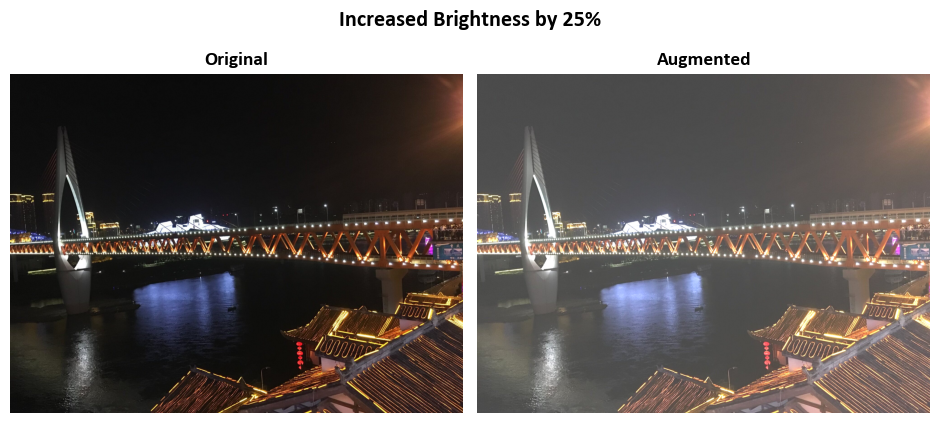

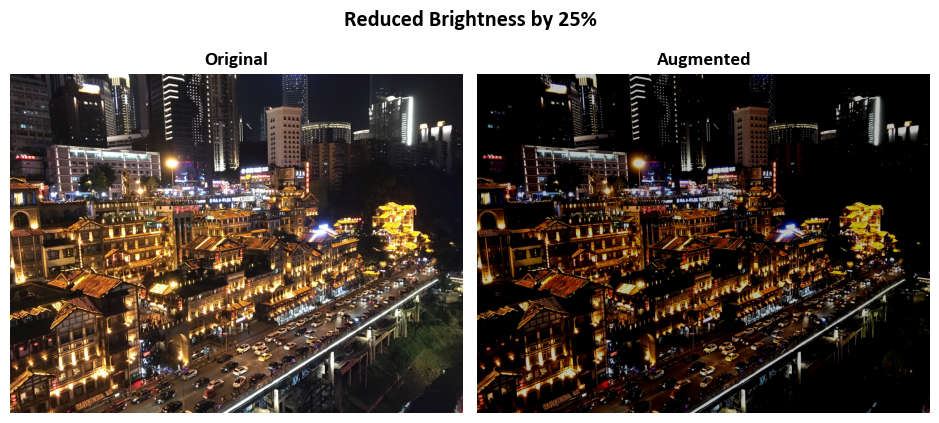

In [3]:
import tensorflow as tf

# Function to adjust brightness and display images
def adjust_and_show_brightness(img, delta, title,
                              names=['Original', 'Augmented']):
    """
    Adjusts the brightness of an image and displays the original and adjusted versions.

    Parameters:
    - img (tf.Tensor): The input image tensor.
    - delta (float): The amount by which to adjust the brightness. Positive values increase brightness, 
                    and negative values decrease brightness.
    - title (str): The title of the displayed images.
    - names (list): A list of strings representing the names of the images to be displayed.
    """
    adjusted_img = tf.image.adjust_brightness(img, delta=delta)
    _ = ImShow([img, adjusted_img], names, title=title)

# Load example images
images = Sample_Images()

# Increase brightness by 25%
adjust_and_show_brightness(images.read_image('Qiansimen_Bridge'),
                           delta=0.25,
                           title= r'Increased Brightness by 25%')

# Reduce brightness by 25%
adjust_and_show_brightness(images.read_image('Northwest_Gate'),
                           delta=-0.25,
                           title= r'Reduced Brightness by 25%')

### Contrast Adjustment with `tf.image.adjust_contrast`

The `tf.image.adjust_contrast` function in TensorFlow offers a convenient way to modify the contrast of images. Let's break down how it operates:

1. **Conversion to Float**: Initially, it transforms RGB images into a floating-point representation. Think of this as allowing pixel values to have decimal fractions. We'll denote the original image as $I$ and the converted floating-point image as $I_f$.

2. **Contrast Adjustment**: Now, let's delve into adjusting contrast. Contrast refers to the difference between the bright and dark parts of an image. This function performs this adjustment individually for each color channel (e.g., Red, Green, and Blue) within the image.

   The adjustment equation for each channel is as follows:

   \begin{equation}I_{\text{adjusted}} = (I_f - \text{mean}) \times \text{contrast_factor} + \text{mean}\end{equation}

   In this equation, $I_{\text{adjusted}}$ represents the modified image, $\text{mean}$ signifies the average pixel value in that particular channel, and $\text{contrast_factor}$ is a user-defined parameter. A larger $\text{contrast_factor}$ increases contrast, while a smaller value decreases it.

3. **Scaling**: If the original image $I$ employed a different numerical representation (not floating-point), the function scales both the image and the $\text{contrast_factor}$ to be in the same format. This ensures compatibility and coherent contrast adjustments.

4. **Contrast Factor Range**: It's noteworthy that the $\text{contrast_factor}$ can assume any real value spanning from negative infinity to positive infinity. This wide range grants you flexibility in fine-tuning the image's contrast to suit your specific needs.

In essence, [tf.image.adjust_contrast](https://www.tensorflow.org/api_docs/python/tf/image/adjust_contrast) empowers you to manipulate the contrast of an image by adjusting the $\text{contrast_factor}$. It's akin to making dark areas darker and bright areas brighter (or vice versa) by tweaking this parameter. Keep in mind that it independently operates on each color channel, preserving the image's color balance {cite:p}`TensorFlowDocumentation`.

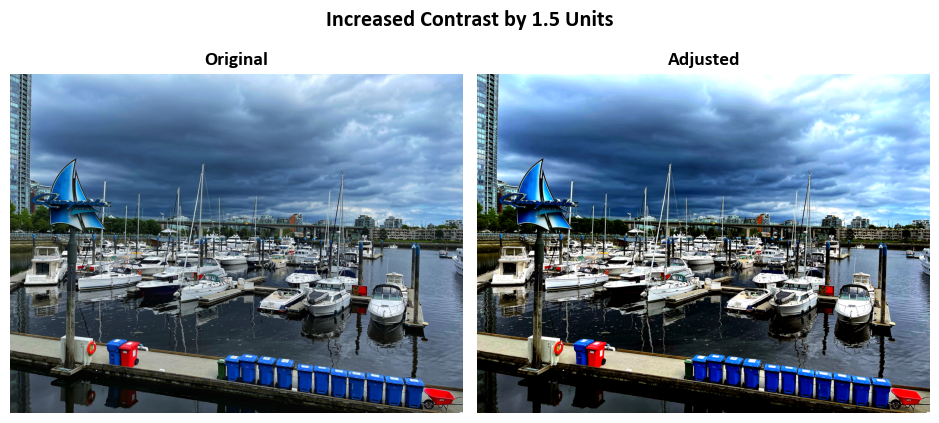

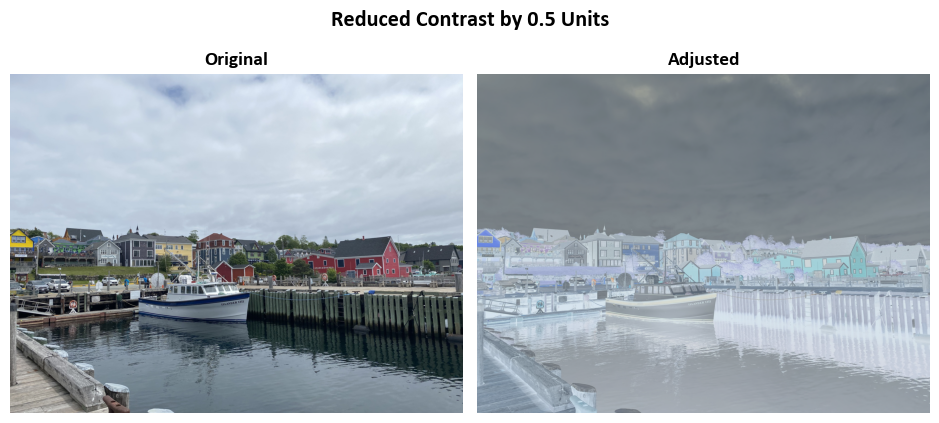

In [4]:
import tensorflow as tf

# Function to adjust contrast and display images
def adjust_and_show_contrast(img, contrast_factor, title,
                              names=['Original', 'Adjusted']):
    """
    Adjusts the contrast of an image and displays the original and adjusted versions.

    Parameters:
    - img (tf.Tensor): The input image tensor.
    - contrast_factor (float): The factor by which to adjust the contrast. 
                              Values greater than 1 increase contrast, 
                              and values between 0 and 1 decrease contrast.
    - title (str): The title of the displayed images.
    - names (list): A list of strings representing the names of the images to be displayed.
    """
    adjusted_img = tf.image.adjust_contrast(img, contrast_factor=contrast_factor)
    _ = ImShow([img, adjusted_img], names, title=title)

# Load example images
images = Sample_Images()

# Increase contrast by 1.5 units
adjust_and_show_contrast(images.read_image('Waterfront'),
                           contrast_factor=1.5, title='Increased Contrast by 1.5 Units')

# Reduce contrast by 0.5 units
adjust_and_show_contrast(images.read_image('Lunenburg'),
                           contrast_factor=-0.5, title='Reduced Contrast by 0.5 Units')

### Gamma Correction with `tf.image.adjust_gamma`

The `tf.image.adjust_gamma` function, also known as the Power Law Transform, provides a powerful means to modify how pixel values in an image behave. Let's break down its operation:

1. **Conversion to Float**: Initially, it converts the input images into a floating-point representation. This means that pixel values can now have decimal places, allowing for more precise transformations. We'll denote the original image as $I$ and the converted floating-point image as $I_f$.

2. **Pixelwise Transformation**: The heart of this function lies in its pixelwise transformation. Each pixel in the image is transformed independently, and this transformation follows the mathematical equation:

   \begin{equation} \text{Out} = \text{gain} \times \text{In}^\gamma \end{equation}

   Here's what each element represents:
   - "Out" is the new pixel value after the transformation.
   - "In" denotes the original pixel value.
   - "gain" is a user-defined parameter that scales pixel intensities. Increasing it brightens the image, while decreasing it darkens the image.
   - "gamma" ($\gamma$) is another parameter often referred to as the "gamma" value. Its value influences the shape of the transformation curve. When $\gamma < 1$, it enhances the contrast in darker areas, making them more pronounced. When $\gamma > 1$, it boosts contrast in brighter areas.

3. **Conversion Back**: After applying the pixelwise transformation, the images are converted back to their original data type. This ensures that the image maintains its expected data format.

In simpler terms, [tf.image.adjust_gamma](https://www.tensorflow.org/api_docs/python/tf/image/adjust_gamma) empowers you to modify how pixel values behave in an image. By adjusting the "gain" and "gamma" parameters, you can control brightness, contrast, and the visual characteristics of the image. It's a versatile tool for enhancing or fine-tuning images to meet specific visual requirements {cite:p}`TensorFlowDocumentation`.

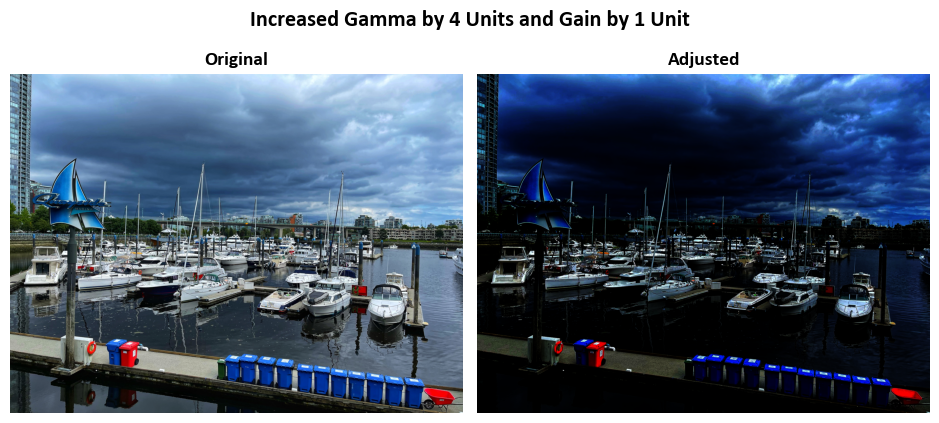

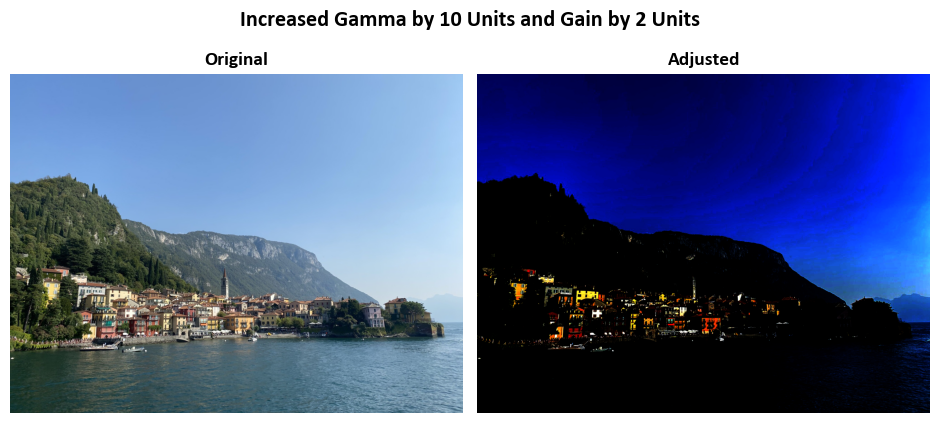

In [5]:
import tensorflow as tf

# Function to adjust gamma and display images
def adjust_and_show_gamma(img, gamma, gain, title,
                              names=['Original', 'Adjusted']):
    """
    Adjusts the gamma of an image and displays the original and adjusted versions.

    Parameters:
    - img (tf.Tensor): The input image tensor.
    - gamma (float): The exponent for the gamma correction. 
                    Values greater than 1 increase gamma, 
                    and values between 0 and 1 decrease gamma.
    - gain (float): The constant multiplier for the adjusted image.
    - title (str): The title of the displayed images.
    - names (list): A list of strings representing the names of the images to be displayed.
    """
    adjusted_img = tf.image.adjust_gamma(img, gamma=gamma, gain=gain)
    _ = ImShow([img, adjusted_img], names, title=title)

# Load example images
images = Sample_Images()

# Increase gamma by 4 units and gain by 1 unit
adjust_and_show_gamma(images.read_image('Waterfront'),
                      gamma=4, gain=1,
                      title='Increased Gamma by 4 Units and Gain by 1 Unit')

adjust_and_show_gamma(images.read_image('Lake_Como'),
                      gamma=10, gain=2,
                      title='Increased Gamma by 10 Units and Gain by 2 Units')

### Hue Adjustment with `tf.image.adjust_hue`

The `tf.image.adjust_hue` function provides a convenient method for altering the hue of an RGB image. Hue relates to the color's "shade" or "tone." Here's a breakdown of how it works:

1. **Conversion to Float**: To begin, the function converts the input RGB image into a floating-point representation. This conversion allows for more precise adjustments. Let's denote the original RGB image as $I$ and the converted floating-point image as $I_f$.

2. **Conversion to HSV**: Subsequently, $I_f$ is transformed into the Hue-Saturation-Value (HSV) color space. In this color space, colors are represented differently: Hue (H) defines the color itself, Saturation (S) represents color intensity, and Value (V) signifies brightness. This conversion facilitates the manipulation of the hue channel.

3. **Hue Adjustment**: The core of the adjustment lies in modifying the hue. The function rotates the hue channel (H) by an angle designated as "delta." This rotation effectively alters the color tone of the image.

   Let's denote the adjusted HSV image as $I_{\text{adjusted}}$ and the original hue channel as $H$. The adjustment can be expressed as:

   \begin{equation}I_{\text{adjusted}}(H) = H + \delta\end{equation}

   In this equation, $H + \delta$ signifies the rotated hue channel.

4. **Conversion Back to RGB**: After modifying the hue in the HSV color space, the function converts the image back to the RGB color space. This step ensures that the image retains its original data type and format.

5. **Delta Range**: It's important to note that the "delta" parameter must fall within the interval [-1, 1]. This constraint ensures that hue adjustments remain within the range of possible colors, preventing unintended color artifacts.

In simpler terms, [tf.image.adjust_hue](https://www.tensorflow.org/api_docs/python/tf/image/adjust_hue) allows you to change the color tone of an RGB image by rotating its hue channel. The "delta" parameter controls the extent of color shift. A positive delta shifts the colors towards warmer tones, while a negative delta shifts them towards cooler hues {cite:p}`TensorFlowDocumentation`.

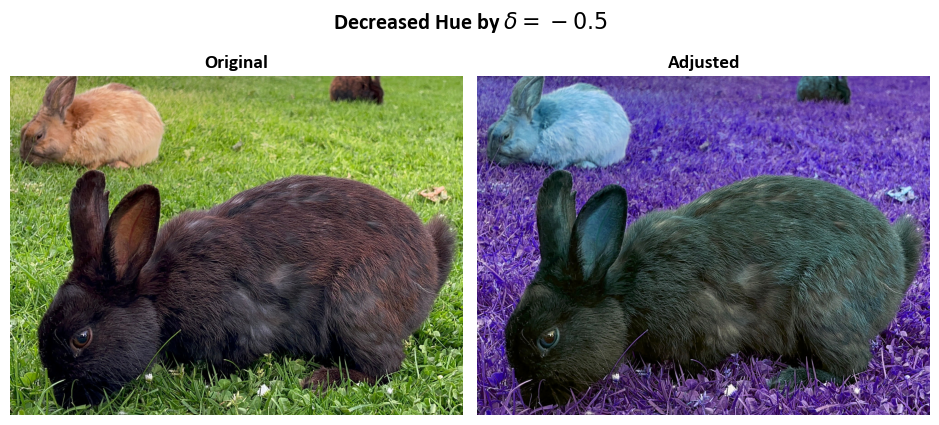

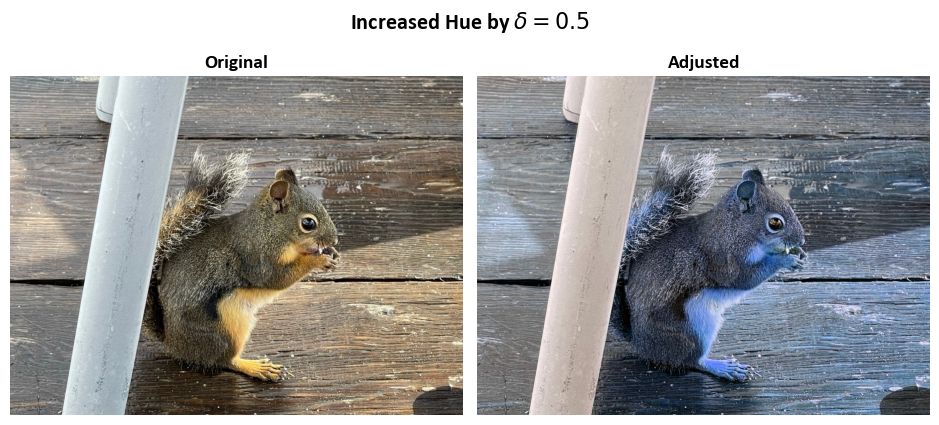

In [6]:
import tensorflow as tf

# Function to adjust hue and display images
def adjust_and_show_hue(img, delta, title,
                        names=['Original', 'Adjusted']):
    """
    Adjusts the hue of an image and displays the original and adjusted versions.

    Parameters:
    - img (tf.Tensor): The input image tensor.
    - delta (float): The amount by which to adjust the hue. 
                    Values between -1 and 1 are allowed, where -1 corresponds to a complete reversal of hue,
                    0 corresponds to no change, and 1 corresponds to a complete reversal of hue.
    - title (str): The title of the displayed images.
    - names (list): A list of strings representing the names of the images to be displayed.
    """
    adjusted_img = tf.image.adjust_hue(img, delta=delta)
    _ = ImShow([img, adjusted_img], names, title=title)

# Load example images
images = Sample_Images()

# Decrease hue by delta = -0.5
adjust_and_show_hue(images.read_image('Rabbits'),
                    delta=-0.5,
                    title=r'Decreased Hue by $\delta = -0.5$')

# Increase hue by delta = 0.5
adjust_and_show_hue(images.read_image('Squirrel'),
                    delta=0.5,
                    title=r'Increased Hue by $\delta = 0.5$')

### JPEG Encoding and Decoding with Quality Adjustment

`tf.image.adjust_jpeg_quality` offers a convenient way to manipulate image quality by performing JPEG encoding and decoding. Here's a detailed breakdown of its operation:

1. **Conversion to uint8**: Initially, the image is transformed into an unsigned 8-bit integer (uint8) representation. This ensures that pixel values are confined within the range [0, 255], maintaining data integrity.

2. **JPEG Encoding**: Subsequently, the image is subjected to JPEG encoding, with a critical parameter called `jpeg_quality` in effect. This parameter serves as the primary means to control the level of compression applied to the image. The value of `jpeg_quality` plays a pivotal role:

   - Higher values of `jpeg_quality`, when closer to 100, lead to reduced compression, resulting in larger file sizes and superior image fidelity.
   - Conversely, lower values of `jpeg_quality`, nearing 0, intensify compression, generating smaller file sizes but potentially causing a reduction in image quality.

3. **JPEG Decoding**: Following the encoding phase, the compressed image is then decoded, effectively reverting it to its original format.

4. **Conversion Back**: Upon successful decoding, the image is reconverted back to its initial data type, ensuring that the data format remains consistent.

5. **Quality Range**: It's imperative to note that the `jpeg_quality` parameter must reside within the defined range of [0, 100]. Any values outside this range are invalid for specifying JPEG encoding quality settings.

In essence, [tf.image.adjust_jpeg_quality](https://www.tensorflow.org/api_docs/python/tf/image/adjust_jpeg_quality) empowers users to finely control the level of compression applied to an image, thereby influencing both its visual quality and file size. The `jpeg_quality` parameter operates as a scalar factor that governs the degree of compression during the JPEG encoding process {cite:p}`TensorFlowDocumentation`.

From a practical standpoint, one can perceive this as a balancing act between image quality and file size. Higher values of `jpeg_quality` prioritize image quality, yielding larger files, while lower values emphasize compression, leading to smaller file sizes with the potential for a reduction in image clarity.

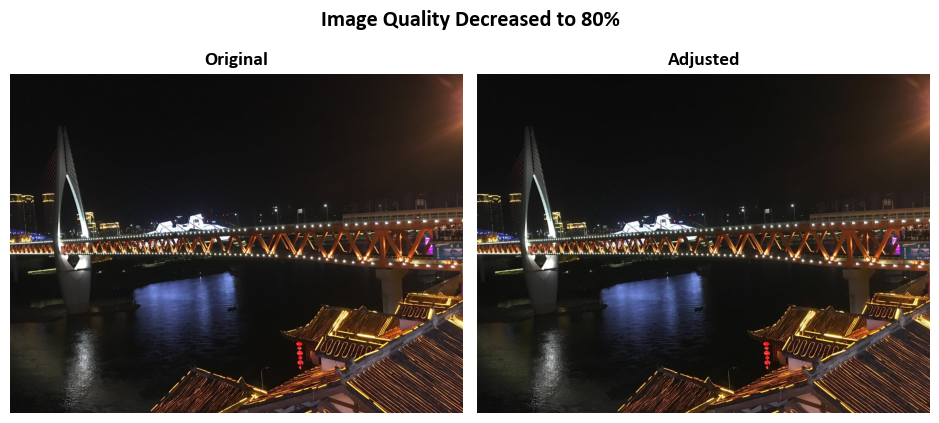

In [7]:
import tensorflow as tf

# Function to adjust JPEG quality and display images
def adjust_and_show_jpeg_quality(img, jpeg_quality, title,
                        names=['Original', 'Adjusted']):
    """
    Adjusts the JPEG quality of an image and displays the original and adjusted versions.

    Parameters:
    - img (tf.Tensor): The input image tensor.
    - jpeg_quality (int): The desired JPEG quality level for the adjusted image. 
                         Values range from 0 to 100, where 0 represents the lowest quality and 100 represents the highest.
    - title (str): The title of the displayed images.
    - names (list): A list of strings representing the names of the images to be displayed.
    """
    adjusted_img = tf.image.adjust_jpeg_quality(img, jpeg_quality=jpeg_quality)
    _ = ImShow([img, adjusted_img], names, title=title)

# Load example images
images = Sample_Images()

# Decrease JPEG quality to 80%
adjust_and_show_jpeg_quality(images.read_image('Qiansimen_Bridge'),
                    jpeg_quality=80,
                    title='Image Quality Decreased to 80%')

### Saturation Adjustment in HSV Color Space

`tf.image.adjust_saturation` provides a convenient means to adjust the saturation of RGB images. Saturation refers to the intensity or vividness of colors. Here's a detailed breakdown of how it operates:

1. **Conversion to Float**: Initially, the RGB images are converted into a floating-point representation. This conversion allows for precise adjustments and the handling of decimal values. Let's denote the original RGB image as $I$ and the converted floating-point image as $I_f$.

2. **Conversion to HSV**: The method transforms $I_f$ into the Hue-Saturation-Value (HSV) color space. In HSV, colors are represented differently: Hue (H) represents the color itself, Saturation (S) is the intensity of the color, and Value (V) is the brightness. This conversion facilitates easy manipulation of the saturation channel.

3. **Saturation Adjustment**: Now, it's time to modify the saturation. The method multiplies the saturation channel (S) by a parameter called `saturation_factor`. The result is then clipped to ensure it remains within the valid range.

   Let's denote the adjusted HSV image as $I_{\text{adjusted}}$ and the original saturation channel as $S$. The adjustment can be expressed as:

   \begin{equation}I_{\text{adjusted}}(S) = \text{clip}(S \times \text{saturation_factor})\end{equation}

   Here, $\text{clip}(x)$ ensures that the result remains within the valid range [0, 1].

4. **Conversion Back to RGB**: After adjusting the saturation in the HSV color space, the images are converted back to the RGB color space. This step ensures that the images maintain their original data type and format.

5. **Saturation Factor Range**: It's crucial to note that the `saturation_factor` parameter must fall within the interval [0, $\infty$]. Values outside this range are not valid for specifying saturation adjustments.

In mathematical terms, [tf.image.adjust_saturation](https://www.tensorflow.org/api_docs/python/tf/image/adjust_saturation) empowers you to control the saturation of RGB images. The `saturation_factor` parameter acts as a scalar factor that influences the saturation intensity. A higher factor increases saturation, making colors more vivid, while a lower factor decreases saturation, resulting in more muted colors {cite:p}`TensorFlowDocumentation`.

For practical purposes, think of this method as a tool to enhance or reduce the intensity of colors in images. It allows you to bring out vibrant colors or tone them down, depending on your specific image processing needs.

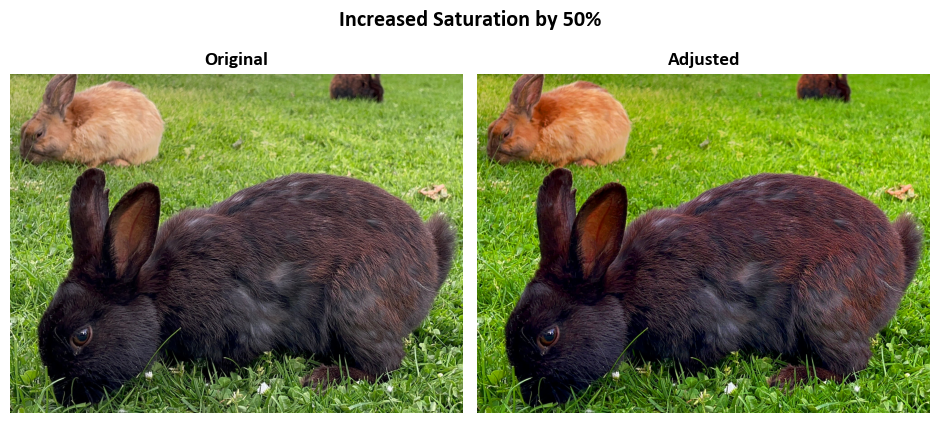

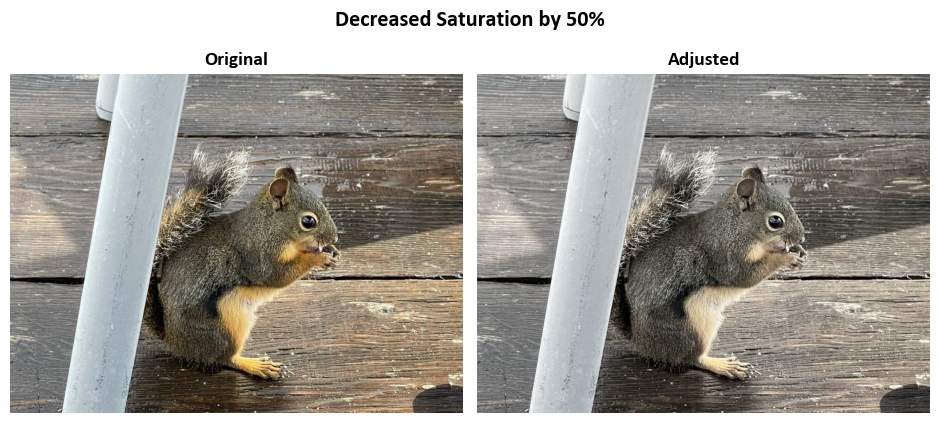

In [8]:
import tensorflow as tf

# Function to adjust saturation and display images
def adjust_and_show_saturation(img, saturation_factor, title,
                        names=['Original', 'Adjusted']):
    """
    Adjusts the saturation of an image and displays the original and adjusted versions.

    Parameters:
    - img (tf.Tensor): The input image tensor.
    - saturation_factor (float): The factor by which to adjust the saturation. 
                               Values greater than 1 increase saturation, 
                               and values between 0 and 1 decrease saturation.
    - title (str): The title of the displayed images.
    - names (list): A list of strings representing the names of the images to be displayed.
    """
    adjusted_img = tf.image.adjust_saturation(img, saturation_factor=saturation_factor)
    _ = ImShow([img, adjusted_img], names, title=title)

# Load example images
images = Sample_Images()

# Increase saturation by 50%
adjust_and_show_saturation(images.read_image('Rabbits'),
                            saturation_factor=1.5,
                            title='Increased Saturation by 50%')

# Decrease saturation by 50%
adjust_and_show_saturation(images.read_image('Squirrel'),
                            saturation_factor=0.5,
                            title='Decreased Saturation by 50%')

## Cropping, Flipping and Rotating an Image

### Central Crop

The `tf.image.central_crop` function is designed to remove the outer parts of an image while retaining the central region of the image along each dimension. Its behavior is determined by the `central_fraction` parameter. When you specify `central_fraction = 0.5`, this function returns the region marked with "X" in the diagram below:

```
 --------
|        |
|  XXXX  |
|  XXXX  |
|        |
 --------
```

In this diagram, "X" represents the central 50% of the image. The larger the value of `central_fraction`, the larger the dimension of the region to be cropped and retained {cite:p}`TensorFlowDocumentation`.

This function can operate on either a single image (where the image is a 3-D Tensor) or a batch of images (where the image is a 4-D Tensor). It provides a convenient way to focus on the central portion of an image, effectively cropping away the outer areas {cite:p}`TensorFlowDocumentation`.

In summary, [tf.image.central_crop](https://www.tensorflow.org/api_docs/python/tf/image/central_crop) allows you to control the size of the central region you want to retain from an image. It's particularly useful when you want to emphasize or analyze the central content of an image while discarding peripheral information.

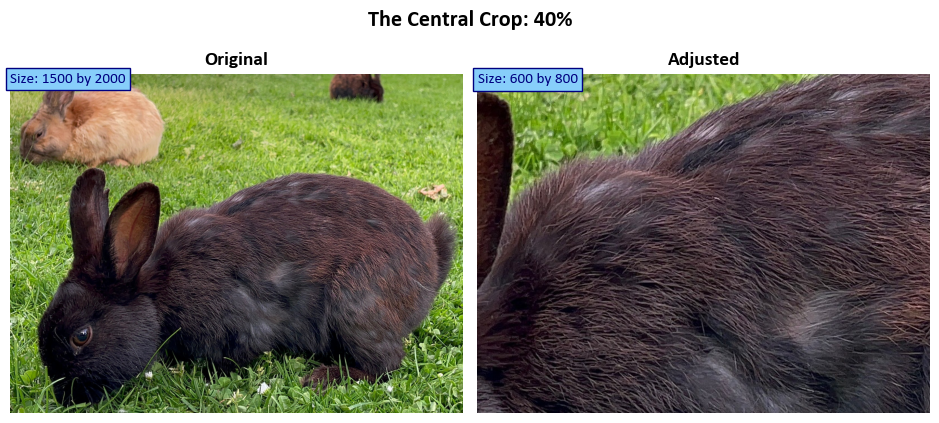

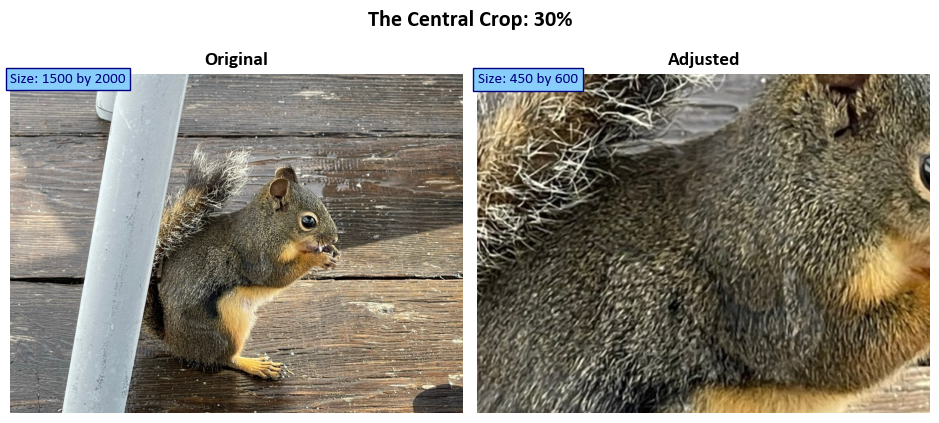

In [9]:
import tensorflow as tf

# Function to adjust central crop and display images
def adjust_and_show_central_crop(img, central_fraction, title,
                        names=['Original', 'Adjusted']):
    """
    Adjusts the central crop of an image and displays the original and adjusted versions.

    Parameters:
    - img (tf.Tensor): The input image tensor.
    - central_fraction (float): The fraction of the central part of the image to retain. 
                               Values between 0 and 1 determine the proportion of the central crop.
    - title (str): The title of the displayed images.
    - names (list): A list of strings representing the names of the images to be displayed.
    """
    adjusted_img = tf.image.central_crop(img, central_fraction=central_fraction)
    fig, ax = ImShow([img, adjusted_img], names, title=title)
    # Add text indicating the size of the original and transformed images
    _ = ax[0].text(x=0, y=int(0.02 * img.shape[1]), s=f'Size: {img.shape[0]} by {img.shape[1]}',
                   size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))
    _ = ax[1].text(x=0, y=int(0.02 * adjusted_img.shape[1]), s=f'Size: {adjusted_img.shape[0]} by {adjusted_img.shape[1]}',
                   size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))

# Load example images
images = Sample_Images()

# Apply central crop of 40%
adjust_and_show_central_crop(images.read_image('Rabbits'),
                            central_fraction=0.4,
                            title='The Central Crop: 40%')

# Apply central crop of 30%
adjust_and_show_central_crop(images.read_image('Squirrel'),
                            central_fraction=0.3,
                            title='The Central Crop: 30%')

### Flip Along Width Dimension

The manipulation of image data through flip operations constitutes a fundamental aspect of image processing, offering diverse perspectives on data augmentation. This discussion encompasses both horizontal and vertical flips, implemented through TensorFlow functions, specifically `tf.image.flip_left_right` and `tf.image.flip_up_down`.

* **Horizontal Flip (Flip Along Width Dimension)**:
The `tf.image.flip_left_right` function executes a horizontal flip by inversely arranging pixels along the width dimension. Mathematically, this operation is represented as follows:

    \begin{equation}
    I_{\text{flipped}}[h, w] = I[h, (width - 1) - w]
    \end{equation}

    Here, $I_{\text{flipped}}[h, w]$ denotes the pixel value at position (h, w) in the horizontally flipped image, $I[h, w]$ signifies the original pixel value at position (h, w) in the original image, $(width - 1)$ represents the maximum index along the width dimension, and $(width - 1) - w$ calculates the new width index for the flipped image, effectively reversing the order of pixels along the horizontal axis.

* **Vertical Flip (Flip Along Height Dimension)**:
Complementing the horizontal flip, the `tf.image.flip_up_down` function enables a vertical flip by reversing the order of pixels along the height dimension. The mathematical expression for the vertical flip operation is succinctly defined as:

    \begin{equation}
    I_{\text{flipped}}[h, w] = I[(height - 1) - h, w]
    \end{equation}

    In this equation, $I_{\text{flipped}}[h, w]$ represents the pixel value at position (h, w) in the vertically flipped image, $I[h, w]$ denotes the original pixel value at position (h, w) in the original image, $(height - 1)$ signifies the maximum index along the height dimension, and $(height - 1) - h$ calculates the new height index for the flipped image, effectively reversing the order of pixels along the vertical axis.

These flip operations, integral to data augmentation in image processing, provide a comprehensive approach to diversifying datasets for robust model training. The presented mathematical formulations offer clarity in understanding the pixel rearrangements involved in both horizontal and vertical flips.

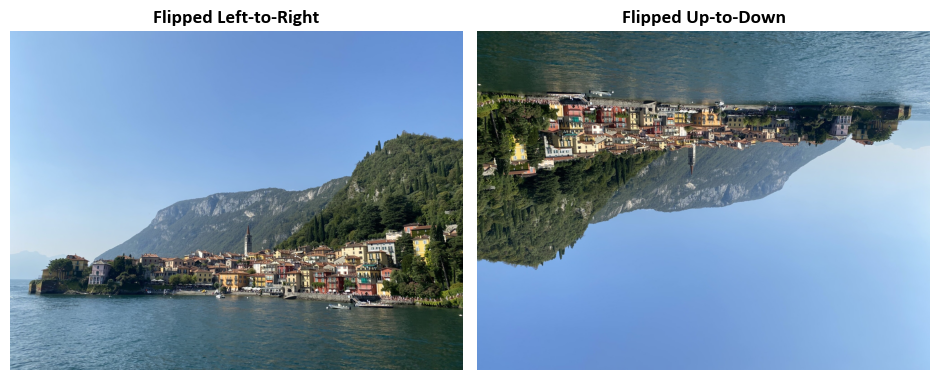

In [10]:
# Load example images
images = Sample_Images()

# Read an example image
img = images.read_image('Lake_Como')

# Apply flip operations to the image
augmented_images = [tf.image.flip_left_right(img), tf.image.flip_up_down(img)]
aug_names = ['Flipped Left-to-Right', 'Flipped Up-to-Down']

# Display the augmented images with flip operations
_ = ImShow(augmented_images, aug_names, title=False)

### Rotating an Image

The `tf.image.rot90` function in TensorFlow is used to rotate an image by 90 degrees counterclockwise. It takes the following parameters:

- `image`: The input image that you want to rotate.
- `k`: An integer that determines the number of times the image is rotated by 90 degrees counterclockwise. By default, it is set to 1, which means the image is rotated once. You can set it to 2 to rotate the image 180 degrees counterclockwise or 3 to rotate it 270 degrees counterclockwise.
- `name`: An optional name for the operation.

Mathematically, rotating an image by 90 degrees counterclockwise involves rearranging the pixel values of the image to achieve the desired rotation. Let's denote the original image as $I$ and the rotated image as $I_{\text{rotated}}$.

For a single 90-degree counterclockwise rotation ($k = 1$), you can express the rotation mathematically as follows:

\begin{equation}I_{\text{rotated}}[i, j] = I[j, \text{height} - 1 - i]\end{equation}

Here, $I_{\text{rotated}}[i, j]$ represents the pixel value at position (i, j) in the rotated image, $I[j, \text{height} - 1 - i]$ represents the pixel value at position (j, height - 1 - i) in the original image, and height is the height of the image.

This equation essentially swaps the rows and columns of the original image, achieving a 90-degree counterclockwise rotation.

For other values of $k$ (2 or 3), multiple rotations are applied accordingly. Each rotation of 90 degrees counterclockwise involves this swapping of rows and columns, and the final rotated image is obtained after applying the specified number of rotations {cite:p}`TensorFlowDocumentation`.

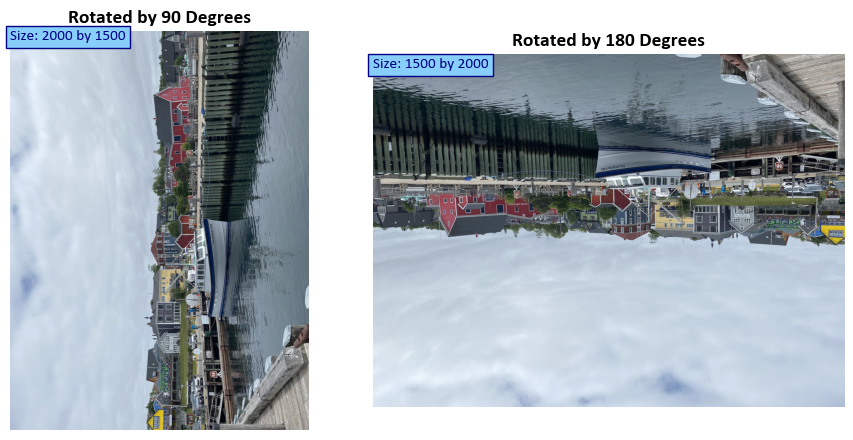

In [11]:
# Load example images
images = Sample_Images()

# Read an example image
img = images.read_image('Lunenburg')

# Apply rotation operations to the image
augmented_images = [tf.image.rot90(img, k=1), tf.image.rot90(img, k=2)]
aug_names = ['Rotated by 90 Degrees', 'Rotated by 180 Degrees']

# Display the augmented images with rotation operations
fig, ax = ImShow(augmented_images, aug_names, title=False)

# Add text indicating the size of the original and transformed images
for c in range(2):
    _ = ax[c].text(x=0, y=int(0.03 * augmented_images[c].shape[1]),
                   s=f'Size: {augmented_images[c].shape[0]} by {augmented_images[c].shape[1]}',
                   size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))

## RGB, Grayscale and HSV

### Grayscale and RGB

1. `tf.image.rgb_to_grayscale`

The `tf.image.rgb_to_grayscale` function is used to convert an RGB (Red, Green, Blue) image to grayscale. Grayscale images represent each pixel with a single intensity value, typically ranging from 0 (black) to 255 (white), where 0 represents no intensity (black) and 255 represents full intensity (white).

Mathematically, this conversion involves a weighted average of the RGB channels to calculate the grayscale intensity. Let's denote the original RGB image as $I$ and the resulting grayscale image as $I_{\text{gray}}$. The conversion can be represented as follows for each pixel $(x, y)$:

\begin{equation}I_{\text{gray}}(x, y) = 0.2989 \cdot I_{\text{red}}(x, y) + 0.5870 \cdot I_{\text{green}}(x, y) + 0.1140 \cdot I_{\text{blue}}(x, y)\end{equation}

Here:
- $I_{\text{gray}}(x, y)$ is the grayscale intensity at pixel $(x, y)$ in the resulting grayscale image.
- $I_{\text{red}}(x, y)$ represents the intensity of the red channel at pixel $(x, y)$ in the original RGB image.
- $I_{\text{green}}(x, y)$ represents the intensity of the green channel at pixel $(x, y)$ in the original RGB image.
- $I_{\text{blue}}(x, y)$ represents the intensity of the blue channel at pixel $(x, y)$ in the original RGB image.

The constants 0.2989, 0.5870, and 0.1140 are the weights assigned to the red, green, and blue channels, respectively, based on the human perception of color.

2. `tf.image.grayscale_to_rgb`

The `tf.image.grayscale_to_rgb` function is used to convert a grayscale image back to an RGB image. In this operation, the same grayscale intensity value is used for all three RGB channels, resulting in a grayscale image being transformed into a color image.

Mathematically, this conversion involves assigning the grayscale intensity to all three RGB channels for each pixel. Let's denote the grayscale image as $I_{\text{gray}}$ and the resulting RGB image as $I_{\text{rgb}}$. The conversion can be represented as follows for each pixel $(x, y)$:

\begin{equation}I_{\text{rgb}}(x, y) = [I_{\text{gray}}(x, y), I_{\text{gray}}(x, y), I_{\text{gray}}(x, y)]\end{equation}

Here:
- $I_{\text{rgb}}(x, y)$ is the RGB color value at pixel $(x, y)$ in the resulting RGB image.
- $I_{\text{gray}}(x, y)$ is the grayscale intensity at pixel $(x, y)$ in the original grayscale image.

This operation essentially sets the red, green, and blue channels of each pixel to the same grayscale intensity value, effectively creating a color image where all channels have identical values.

In summary, [tf.image.rgb_to_grayscale](https://www.tensorflow.org/api_docs/python/tf/image/rgb_to_grayscale) converts an RGB image to grayscale by calculating a weighted average of the RGB channels, while `tf.image.grayscale_to_rgb` converts a grayscale image back to RGB by assigning the same grayscale intensity to all three RGB channels for each pixel {cite:p}`TensorFlowDocumentation`.

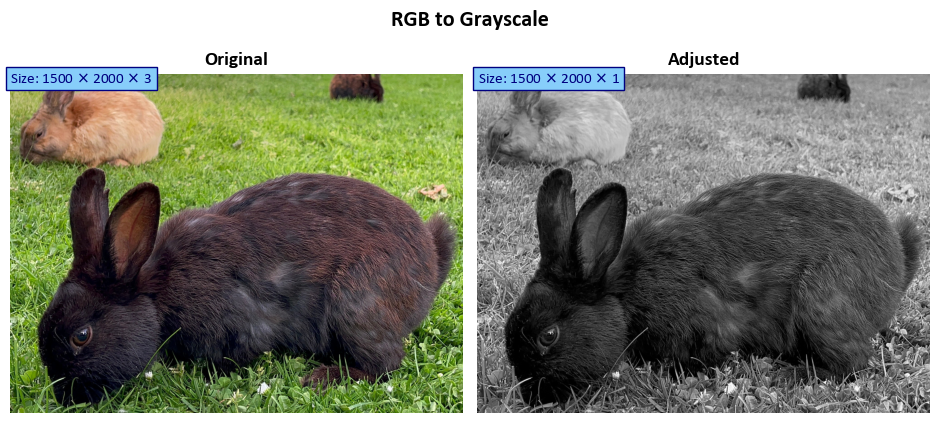

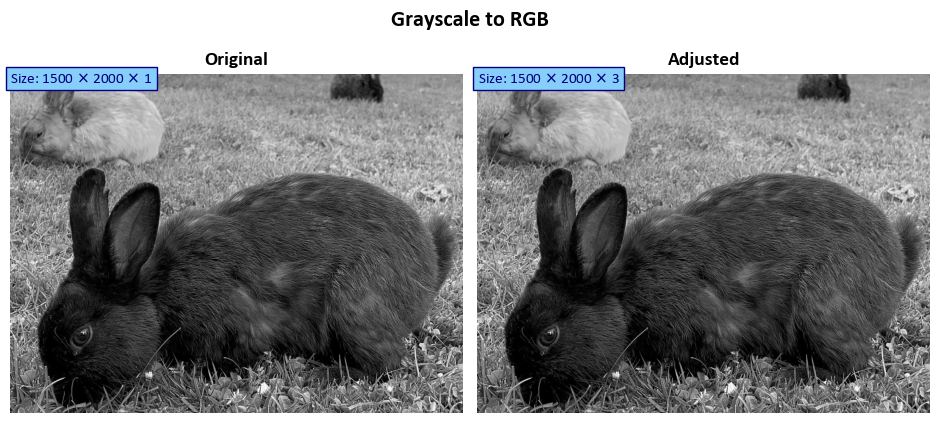

In [12]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Function to adjust central crop and display images
def adjust_and_show_rgb_to_grayscale(img, title, names=['Original', 'Adjusted']):
    """
    Adjusts the central crop of an RGB image to grayscale and displays the original and adjusted versions.

    Parameters:
    - img (tf.Tensor): The input image tensor (RGB format).
    - title (str): The title of the displayed images.
    - names (list): A list of strings representing the names of the images to be displayed.
    """
    # Convert RGB image to grayscale
    adjusted_img = tf.image.rgb_to_grayscale(img)
    
    # Prepare images for display
    aug_imgs = [img, adjusted_img]
    
    # Display the images using the ImShow function
    fig, ax = ImShow(aug_imgs, names, title=title, grayscale=True)
    
    # Add text indicating the size of each image
    for a, img in zip(ax, aug_imgs):
        if len(img.shape) == 3:
            tag = fr'Size: {img.shape[0]} $\times$ {img.shape[1]} $\times$ {img.shape[2]}'
        else:
            tag = fr'Size: {img.shape[0]} $\times$ {img.shape[1]}'
        _ = a.text(x=0, y=int(0.02 * img.shape[1]),
                   s=tag,
                   size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))
    
    # Display the plot
    plt.show()
    
    # Return the adjusted grayscale image
    return adjusted_img

def adjust_and_show_grayscale_to_rgb(img, title, names=['Original', 'Adjusted']):
    """
    Converts a grayscale image to RGB and displays the original and adjusted versions.

    Parameters:
    - img (tf.Tensor): The input image tensor (grayscale format).
    - title (str): The title of the displayed images.
    - names (list): A list of strings representing the names of the images to be displayed.
    """
    # Convert grayscale image to RGB
    adjusted_img = tf.image.grayscale_to_rgb(img)
    
    # Display the images using the ImShow function
    fig, ax = ImShow([img, adjusted_img], names, title=title, grayscale=True)
    
    # Add text indicating the size of each image
    for a, img in zip(ax, [img, adjusted_img]):
        if len(img.shape) == 3:
            tag = fr'Size: {img.shape[0]} $\times$ {img.shape[1]} $\times$ {img.shape[2]}'
        else:
            tag = fr'Size: {img.shape[0]} $\times$ {img.shape[1]}'
        _ = a.text(x=0, y=int(0.02 * img.shape[1]),
                   s=tag,
                   size=11, color='Navy', bbox=dict(boxstyle="square", ec='Navy', fc='LightSkyBlue'))
    
    # Display the plot
    plt.show()

# Load example images
images = Sample_Images()

# Apply RGB to Grayscale conversion and display
img_grayscale = adjust_and_show_rgb_to_grayscale(images.read_image('Rabbits'), title='RGB to Grayscale')

# Apply Grayscale to RGB conversion and display
adjust_and_show_grayscale_to_rgb(img_grayscale, title='Grayscale to RGB')

### RGB and HSV

1. `tf.image.rgb_to_hsv`

- Input: `images` is a tensor containing RGB images. The values in `images` must be in the range [0, 1].

- Output: A tensor of the same shape as `images` containing the HSV (Hue, Saturation, Value) representation of each pixel.

- Mathematical Explanation:
  - For each pixel in the input RGB image, the function calculates the HSV values.
  - The output tensor has the same dimensions as the input, with each pixel represented by a triplet of values [H, S, V].
  - `output[..., 0]` represents the hue component, which describes the color's tone. A hue of 0 corresponds to pure red, 1/3 corresponds to pure green, and 2/3 corresponds to pure blue. Hue values are normalized to the range [0, 1].
  - `output[..., 1]` represents the saturation component, which measures the intensity or vividness of the color. Saturation values are in the range [0, 1], where 0 is completely unsaturated (grayscale) and 1 is fully saturated.
  - `output[..., 2]` represents the value component, which represents the brightness of the color. Value values are in the range [0, 1], where 0 is black (no brightness) and 1 is the full brightness of the color.

2. `tf.image.hsv_to_rgb`

- Input: `images` is a tensor containing HSV images. The values in `images` must be in the range [0, 1].

- Output: A tensor of the same shape as `images` containing the RGB (Red, Green, Blue) representation of each pixel.

- Mathematical Explanation:
  - For each pixel in the input HSV image, the function calculates the corresponding RGB values.
  - The output tensor has the same dimensions as the input, with each pixel represented by a triplet of values [R, G, B].
  - The conversion from HSV to RGB follows standard color space transformations.
  - The hue value (`images[..., 0]`) is mapped to the RGB color wheel to determine the color.
  - The saturation value (`images[..., 1]`) scales the intensity of the color, with 0 producing grayscale (no color) and 1 producing fully saturated color.
  - The value value (`images[..., 2]`) controls the brightness of the color, where 0 is black and 1 is the full brightness of the color.
  - The resulting RGB values are in the range [0, 1], with 0 being no color or no brightness, and 1 being fully saturated and fully bright.

These functions are used for converting between different color representations and are widely used in image processing and computer vision tasks.

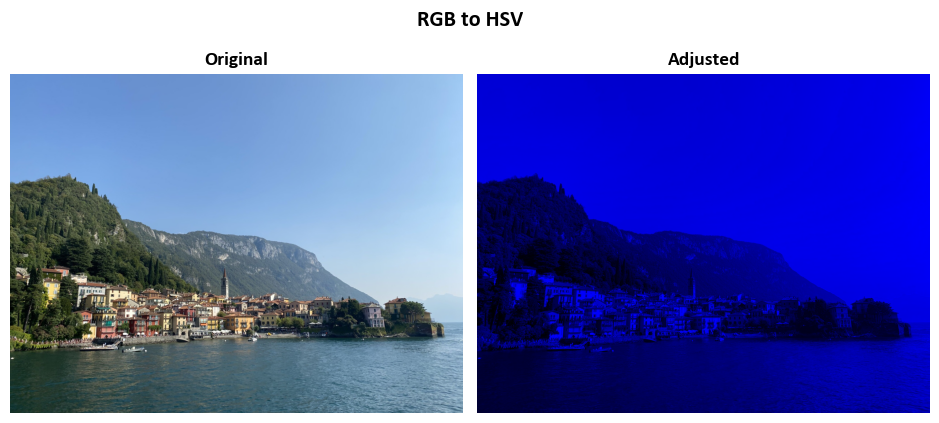

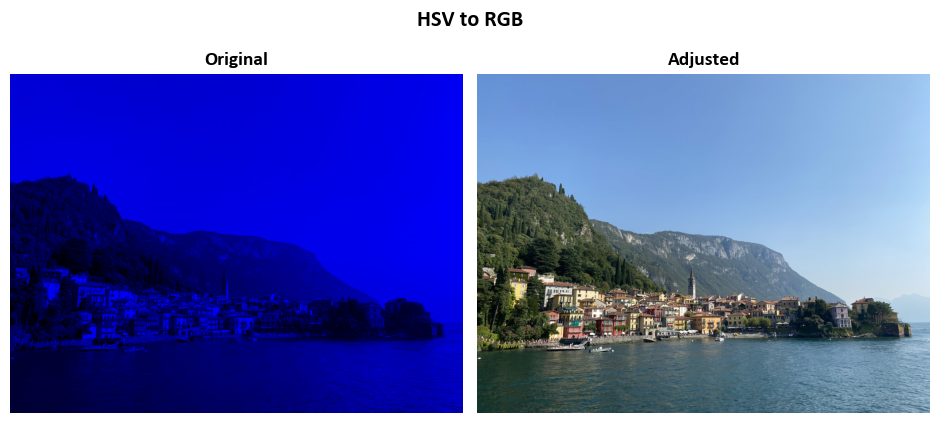

In [13]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Define a function that normalizes image values to the range [0, 1]
def Img_Norm(img):
    '''
    Normalizes image values to the range [0, 1].

    Parameters:
    img (tf.Tensor): Input image tensor.

    Returns:
    tf.Tensor: Normalized image tensor.
    '''
    return (img - tf.reduce_min(img)) / (tf.reduce_max(img) - tf.reduce_min(img))

# Load example images
images = Sample_Images()

# Read an example image
img = images.read_image('Lake_Como')

# Apply rgb_to_hsv operation to the image
adjusted_hsv = tf.image.rgb_to_hsv(img)
adjusted_rgb = tf.image.hsv_to_rgb(adjusted_hsv)

# Display the original and adjusted images with rgb_to_hsv operation
_ = ImShow([img, Img_Norm(adjusted_hsv)], ['Original', 'Adjusted'], title='RGB to HSV')

# Display the original and adjusted images with hsv_to_rgb operation
_ = ImShow([Img_Norm(adjusted_hsv), Img_Norm(adjusted_rgb)], ['Original', 'Adjusted'], title='HSV to RGB')

## Image Gradients

The function `tf.image.image_gradients(image)` computes image gradients using TensorFlow. It returns two output tensors, both with the same shape as the input image, which is `[batch_size, h, w, d]`.

The gradient values are organized in such a way that the vertical gradient component, denoted as `dy`, will always have zeros in the last row of the output tensor. Similarly, the horizontal gradient component, denoted as `dx`, will always have zeros in the last column of the output tensor.

This organization of gradient values facilitates easy alignment with the corresponding pixel locations in the input image, ensuring that the gradient at pixel `(x, y)` corresponds to the difference between the neighboring pixels `(x+1, y)` and `(x, y)` for the horizontal component and `(x, y+1)` and `(x, y)` for the vertical component.

In [14]:
# Load example images
images = Sample_Images()

# Read an example image
img = images.read_image('Lake_Como')

# Set the batch size to 1 (processing one image at a time)
Batch_Size = 1

# Get the height and width of the first image in the 'Images' array
Image_Height = img.shape[0]
Image_Width = img.shape[1]

# Specify the number of color channels (typically 3 for RGB)
Channels = 3

# Create a synthetic image tensor with consecutive values for testing
image = tf.reshape(
    tf.range(Image_Height * Image_Width * Channels, dtype=tf.float32),
    shape=(Batch_Size, Image_Height, Image_Width, Channels))

# Calculate image gradients (dx and dy) using TensorFlow
dx, dy = tf.image.image_gradients(image)

## Image Standardization

The expression `tf.image.per_image_standardization(image)` represents a standardization operation applied to each 3-D image tensor (`x`) within a collection of images represented by the `image` tensor. This operation is commonly used in deep learning for preprocessing input data to ensure that it has a mean of zero and a standard deviation of one. Let's break down the mathematical steps involved:

1. **Calculate the Mean (`mean`):** First, the mean of all values in the 3-D image tensor `x` is computed. This is done by summing up all the pixel values in the image and dividing by the total number of elements in `x`. Mathematically:

   ```
   mean = sum(x) / N
   ```

   Where `N` is the total number of elements in the image.

2. **Calculate the Standard Deviation (`stddev`):** Next, the standard deviation of all values in the image tensor `x` is calculated. The standard deviation is a measure of the spread or variability of the pixel values in the image {cite:p}`TensorFlowDocumentation`.

3. **Calculate `adjusted_stddev`:** `adjusted_stddev` is determined by taking the maximum of `stddev` and `1.0 / sqrt(N)`. This step is introduced to protect against division by zero when handling images with very uniform pixel values. If the standard deviation is too small (close to zero), it could lead to division errors. So, `adjusted_stddev` ensures that there's a minimum standard deviation of `1.0 / sqrt(N)`.

   ```
   adjusted_stddev = max(stddev, 1.0 / sqrt(N))
   ```

4. **Perform Standardization:** Finally, the per-image standardization operation is applied to each pixel in the image tensor `x`. It scales each pixel value by `(x - mean) / adjusted_stddev`. This transformation ensures that the pixel values in the image have a mean of zero and a standard deviation of one, making them suitable for many machine learning algorithms that are sensitive to input data scaling {cite:p}`TensorFlowDocumentation`.

   ```
   standardized_x = (x - mean) / adjusted_stddev
   ```

In summary, `tf.image.per_image_standardization(image)` performs per-image standardization on a collection of images. It calculates the mean and standard deviation of each image and scales the pixel values to have a mean of zero and a standard deviation of one, which is a common preprocessing step to improve the training of deep learning models.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


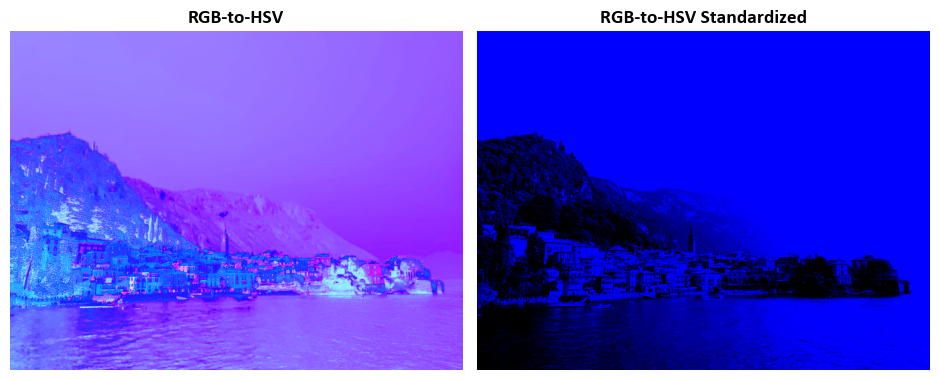

In [15]:
# Load example images
images = Sample_Images()

# Read an example image
img = images.read_image('Lake_Como')

# Apply RGB-to-HSV transformation to the image
aug_img  = tf.image.rgb_to_hsv(img)
aug_img_std = tf.image.per_image_standardization(aug_img)
augmented_images = [aug_img, aug_img_std]
aug_names = ['RGB-to-HSV', 'RGB-to-HSV Standardized']

# Display the augmented images with RGB-to-HSV transformation
_ = ImShow(augmented_images, aug_names, title=False)

## Resizing Images

In the context of image resizing, the "method" argument serves to specify the resampling technique applied during the process. It anticipates an input corresponding to one of the options from the image.ResizeMethod enumeration or a string equivalent of these choices. The available resampling methods are detailed as follows {cite:p}`TensorFlowDocumentation`:

1. **Bilinear**: This method employs bilinear interpolation. When the "antialias" flag is set to true, it transforms into a hat/tent filter function with a radius of 1, particularly beneficial when downsampling the image.

2. **Lanczos3**: Utilizing the Lanczos kernel with a radius of 3, this method offers high-quality practical filtering. However, it may exhibit some ringing artifacts, especially when applied to synthetic images.

3. **Lanczos5**: With a Lanczos kernel of radius 5, this method delivers very high-quality filtering but may display stronger ringing artifacts compared to Lanczos3.

4. **Bicubic**: Leveraging cubic interpolation using Keys' cubic interpolant (equivalent to the Catmull-Rom kernel), this method provides reasonably good quality and is notably faster than Lanczos3Kernel, especially when used for upsampling images.

5. **Gaussian**: Employing a Gaussian kernel with a radius of 3 and a sigma value of 1.5 / 3.0.

6. **Nearest**: Nearest neighbor interpolation. Notably, the "antialias" setting has no effect when used with nearest neighbor interpolation, as it does not involve any smoothing.

7. **Area**: This method conducts anti-aliased resampling with area interpolation. Similar to nearest neighbor interpolation, the "antialias" setting has no effect when used with area interpolation; it consistently applies anti-aliasing.

8. **Mitchellcubic**: The Mitchell-Netravali Cubic non-interpolating filter is suitable for synthetic images, particularly those lacking proper prefiltering. It tends to exhibit fewer ringing artifacts compared to the Keys cubic kernel but may result in less sharp images.

To facilitate reference, the table below summarizes these resizing methods along with their descriptions:

| Resizing Methods | Description                                                                                                                               |
|------------------|-------------------------------------------------------------------------------------------------------------------------------------------|
|       area       | Anti-aliased resampling with area interpolation.                                                                                         |
|      bicubic     | [Bicubic Interpolation](https://en.wikipedia.org/wiki/Bilinear_interpolation)                                                         |
|     bilinear     | [Bilinear Interpolation](https://en.wikipedia.org/wiki/Bilinear_interpolation)                                                        |
|     gaussian     | [Gaussian Filter](https://en.wikipedia.org/wiki/Gaussian_filter)                                                                         |
|     lanczos3     | [Lanczos Resampling with Radius 3](https://en.wikipedia.org/wiki/Lanczos_resampling)                                                   |
|     lanczos5     | [Lanczos Resampling with Radius 5](https://en.wikipedia.org/wiki/Lanczos_resampling)                                                   |
|   mitchellcubic  | [Mitchell-Netravali Cubic Non-Interpolating Filter](https://pixinsight.com/doc/docs/InterpolationAlgorithms/InterpolationAlgorithms.html) |
|      nearest     | [Nearest-Neighbor Interpolation](https://en.wikipedia.org/wiki/Nearest-neighbor_interpolation)                                          |



## Random Image Adjustments

A description of various TensorFlow functions for random image adjustments:

| Syntax                                                                                                        | Description                                                     |
|---------------------------------------------------------------------------------------------------------------|-----------------------------------------------------------------|
| [tf.image.random_brightness](https://www.tensorflow.org/api_docs/python/tf/image/random_brightness)      | Randomly adjusts the brightness of images by a factor.             |
| [tf.image.random_contrast](https://www.tensorflow.org/api_docs/python/tf/image/random_contrast)        | Randomly adjusts the contrast of an image or images by a factor.   |
| [tf.image.random_crop](https://www.tensorflow.org/api_docs/python/tf/image/random_crop)            | Randomly crops a tensor to a specified size.                        |
| [tf.image.random_flip_left_right](https://www.tensorflow.org/api_docs/python/tf/image/random_flip_left_right) | Randomly flips an image horizontally (left to right).            |
| [tf.image.random_flip_up_down](https://www.tensorflow.org/api_docs/python/tf/image/random_flip_up_down)       | Randomly flips an image vertically (upside down).               |
| [tf.image.random_hue](https://www.tensorflow.org/api_docs/python/tf/image/random_hue)                         | Randomly adjusts the hue of RGB images.                |
| [tf.image.random_jpeg_quality](https://www.tensorflow.org/api_docs/python/tf/image/random_jpeg_quality)       | Randomly changes jpeg encoding quality to introduce jpeg noise. |
| [tf.image.random_saturation](https://www.tensorflow.org/api_docs/python/tf/image/random_saturation)           | Randomly adjusts the saturation of RGB images.         |

These functions provide a wide range of random adjustments for enhancing image data augmentation and training deep learning models.

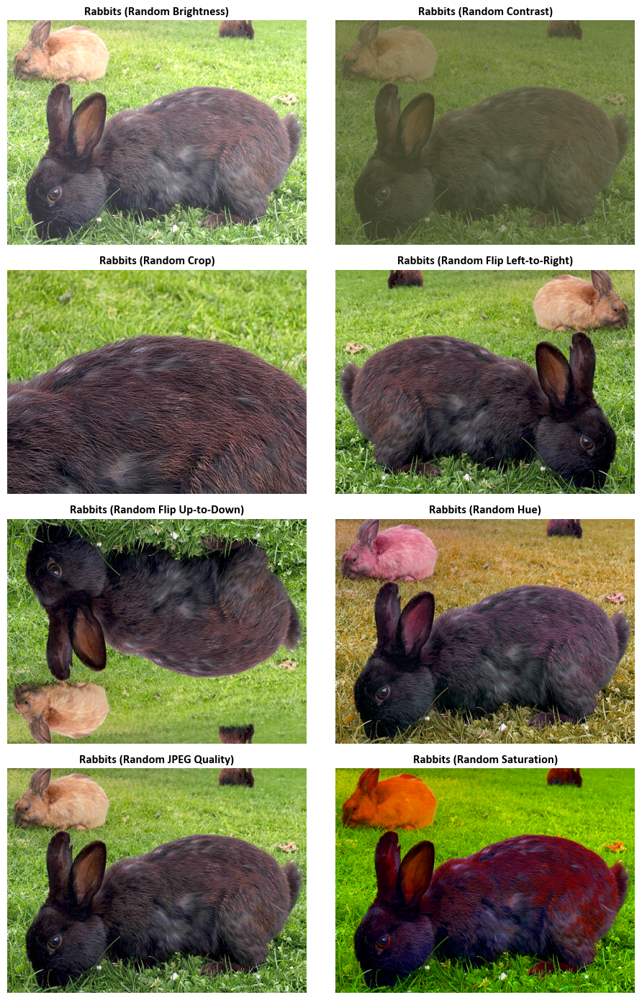

In [16]:
import numpy as np

# Initialize lists to store augmented images and names
Augmented_Images = []
Aug_Names = []

# Load example images
images = Sample_Images()

# Read an example image
Image = images.read_image('Rabbits')
Name = 'Rabbits'

# Define augmentation functions and names
augmentation_functions = [
    (tf.image.random_brightness, {'max_delta': 0.3, 'seed': 1234}),
    (tf.image.random_contrast, {'lower': 0.1, 'upper': 0.5, 'seed': 1234}),
    (tf.image.random_crop, {'size': [int(Image.shape[0] / 2), int(Image.shape[1] / 2), 3]}),
    (tf.image.random_flip_left_right, {'seed': 1234}),
    (tf.image.random_flip_up_down, {'seed': 1234}),
    (tf.image.random_hue, {'max_delta': 0.3, 'seed': 1234}),
    (tf.image.random_jpeg_quality, {'min_jpeg_quality': 15, 'max_jpeg_quality': 50, 'seed': 1234}),
    (tf.image.random_saturation, {'lower': 3, 'upper': 8, 'seed': 1234})
]

augmentation_names = [
    'Random Brightness',
    'Random Contrast',
    'Random Crop',
    'Random Flip Left-to-Right',
    'Random Flip Up-to-Down',
    'Random Hue',
    'Random JPEG Quality',
    'Random Saturation'
]

# Apply augmentations
for func, params in augmentation_functions:
    Augmented_Images.append(func(Image, **params))
    Aug_Names.append(f'{Name} ({augmentation_names[len(Augmented_Images) - 1]})')

# Display augmented images
N = len(Augmented_Images)
rows = int(np.ceil(N / 2))
fig, ax = plt.subplots(rows, 2, figsize=(9.5, 3.5 * rows))
ax = ax.ravel()

for i in range(N):
    ax[i].imshow(Augmented_Images[i])
    ax[i].axis('off')
    ax[i].set_aspect(aspect=1)
    ax[i].set_title(Aug_Names[i], fontproperties={'weight': 'bold'}, fontsize=12)

plt.tight_layout()